In [1]:
#Import necessary libraries
import pandas as pd
import numpy as np
import sqlite3
import warnings
import plotly.express as px
import folium
from folium.plugins import HeatMapWithTime
from folium.plugins import HeatMap
from folium.plugins import FastMarkerCluster
from folium.plugins import MarkerCluster
from folium.plugins import DualMap
from sklearn.model_selection import train_test_split
from sklearn.exceptions import ConvergenceWarning
from sklearn.metrics import average_precision_score
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
from scipy.stats import uniform as sp_randfloat
from sklearn.preprocessing import LabelEncoder
import lightgbm
from lightgbm import LGBMModel,LGBMClassifier
from sklearn.model_selection import GridSearchCV 
from sklearn.metrics import classification_report
from catboost import CatBoostClassifier
import json
import matplotlib.ticker as mtick
from tqdm import tqdm
import pygeohash as pgh
import calmap
import plotly.express as px
from functools import partial
import matplotlib.pyplot as plt
from folium import plugins
import seaborn as sns
import pygeohash as pgh
import geohash_to_geojson 
from scipy.spatial.distance import cityblock
import pygeohash as pgh
from polygon_geohasher.polygon_geohasher import geohashes_to_polygon


from IPython.display import HTML, display
import pprint
%matplotlib inline 

# Machine Learning - Individual Project
**Jasper Kristian Pangan | MSDS 2021**

# Predicting Status of Grab Taxi Booking

<div><span style="background-color: #009F35; padding-top: 100px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: #ffffff; font-size: 20px; font-weight: bold"> INTRODUCTION</span></div>

Most of us have experienced the *carmageddon* along EDSA. Traffic is one of the biggest crisis in our country that several administrations failed to solve. One of the major causes of the heavy traffic in our country is the poor public transportation system [[1]](https://philkotse.com/safe-driving/top-5-major-causes-of-traffic-in-the-philippines-5736). With the constant breakdown of the country's main transit system [[2]](https://rappler.com/newsbreak/iq/things-to-know-about-metro-manila-public-transport-system) and lack of options due to insanely long queue and madness experienced when using public transportation, many Filipinos resort to alternatives. In particular, ride sharing services has grown exponentially during the last decade, specifically Grab. 

In 2018 alone, Grab users traveled the cumulative total of 920 million kilometers [[3]](https://www.carguide.ph/2019/01/7-facts-and-figures-about-grab-in-2018.html) with over 35,000 partner drivers. Grabe reported to have cut down travel time by 70%, but still customers demand for better service [[4]](https://www.techinasia.com/internet-flooded-complaints-grab-scrutinize-app). Since Grab receives around 600,000 bookings per day, [[5]](https://rappler.com/business/grab-philippines-drivers-not-enough-passenger-bookings) they experience an undersupply of vehicles to meet the passenger demand. Hence, it is a common frustration among Filipinos booking for Grab to experience the following: (1) waiting for a long time to book a ride to no avail, (2) costly ride, and (3) drivers cancelling their ride.

This study focuses on the **non-allocation of Grab Taxi bookings**. The data was downloaded from this [site](https://public.tableau.com/profile/daryl6537?fbclid=IwAR06MjpmxjLX5vggRceHMet8Zy5kefoFxUQJks0LGzXqPPi19Ty2LEufN30#!/vizhome/Tabley/Page0) and covers the period from August 8, 2013 to December 20, 2013. This study aims to answer the question, **How can we predict the status of a booking of Grab Taxi?**


<div><span style="background-color: #009F35; padding-top: 100px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: #ffffff; font-size: 20px; font-weight: bold"> BUSINESS VALUE</span></div>

Predicting the status of a grab booking will be beneficial to different stakeholders such as the Grab passengers, Grab partner drivers, Grab, and the local government units. 

- __Grab Passengers__: Grab passengers can use this system to check if their planned schedule booking will be completed or cancelled given the booking information. In this way, they can plan ahead.
- __Grab and its partner drivers__: Grab can use this system to understand the factors why its partner drivers cancel their allocated grab booking. Through this, they can better implement their demand capacity planning.
- __Government__: By understanding location hotspots, local government units can improve public transportation by pushing initiatives such as the P2P bus-service.

<div><span style="background-color: #009F35; padding-top: 100px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: #ffffff; font-size: 20px; font-weight: bold">HIGHLIGHTS </span></div>

- With only a few features available in the dataset, **Feature Engineering** is important in to create valuable insights out of the limited dataset and improve performance of machine learning model. 
- The machine learning model was able to predict with $69\%$ accuracy which is over the threshold set at $PCC_{1.25}$ with $63\%$. **LightGBM** was used for its speed and efficiency in handling a huge dataset.
- The top features found were `hour_18`, `day_of_week_Friday`, and `day_of_week_Sunday`. These features were determined based on **gain**.

<div><span style="background-color: #009F35; padding-top: 100px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: #ffffff; font-size: 20px; font-weight: bold"> METHODOLOGY </span></div>

To be able to predict the status of a Grab booking, a total of 109,463 transactions from August 8 to December 20, 2013 was downloaded from this [Tableau Public](https://public.tableau.com/profile/daryl6537?fbclid=IwAR06MjpmxjLX5vggRceHMet8Zy5kefoFxUQJks0LGzXqPPi19Ty2LEufN30#!/vizhome/Tabley/Page0). The general workflow for classification as shown in Figure 1 involves the following steps:

1. Data Extraction
2. Data Preprocessing
3. Feature Extraction
4. Exploratory Data Analysis
5. Supervised Learning

Each step of the workflow will be discussed in the succeeding sections.



#### Figure 1. Workflow for classifying Grab bookings

### 1. Data Extraction

The dataset was downloaded and extracted from [Tableau Public](https://public.tableau.com/profile/daryl6537?fbclid=IwAR0Ixd8gKuYh37iyNXGSzzWuHCCa6jU_ZcX1Pv5Yw5cAwvujYGC5oexzIkM#!/vizhome/Tabley/Page0).
Prior to filtering and data processing, the Grab dataset is composed of 197,188 rows and 21 columns. A row corresponds to a booking information for Grab Taxi.

In [2]:
df_original = pd.read_csv('DataSeerGrabPrizeData-1.csv')
df_original.columns = df_original.columns.str.lower()


In [3]:
df_original['status'] = df_original['status'].replace({'Cancelled':'Allocated',
                                                       'Completed':'Allocated',
                                                       'Unallocated':'Unallocated',
                                                       'Unal':'Unallocated',})

### 2. Data Preprocessing

Data preprocessing was implemented on the acquired data. Data processing includes:

- Filtering data to bookings in Metro Manila and nearby provinces based on `city`
- Filtering latitude and longitude within the scope of study as shown in [Figure 2](#fig2)
- Filtering data with `status` equal to either Completed or Cancelled
- Converting `date` from string to datetime for easier processing

In [4]:
# Drop calculated columns in Tableau created by the Author
df = df_original.drop(df_original.columns[range(10)],axis=1)

# Rename columns
df.columns = df.columns.str.replace(' ','_')

# Update the datatype of `Date` column from object to 
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y %I:%M:%S %p')

# Drop unnecessary columns
df = df.drop(['platform','source'], axis=1)

# Consider only Metro Manila bookings
df = df[df['city']=='Metro Manila'].copy()
df = df.drop(['city'], axis=1)

# Define a bounding box as defined from: https://gist.github.com/graydon/11198540
ph_lon = [120.8661, 121.3440]
ph_lat = [14.1672, 14.8439]

df = df[(df['pick_up_latitude'] >= ph_lat[0]) &
        (df['pick_up_latitude'] <= ph_lat[1])]
df = df[(df['drop_off_latitude'] >= ph_lat[0]) &
        (df['pick_up_latitude'] <= ph_lat[1])]
df = df[(df['pick_up_longitude'] >= ph_lon[0]) &
        (df['pick_up_longitude'] <= ph_lon[1])]
df = df[(df['drop_off_longitude'] >= ph_lon[0]) &
        (df['pick_up_longitude'] <= ph_lon[1])]


#  Create Date columns (Month, Weeknumber, Weekday, Day, etc.)
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['week'] = df['date'].dt.week
df['day_of_week'] = df['date'].dt.day_name()
df['hour'] = df['date'].dt.hour


# Create is_weekday column
df['weekend'] = df['date'].dt.weekday.replace({0 : 0, 1 : 0, 2 : 0, 3 : 0, 4 : 0, 5: 1, 6 : 1})

<ipython-input-4-3eb78ee59f33>:34: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  df['week'] = df['date'].dt.week


<a id='fig2'></a>

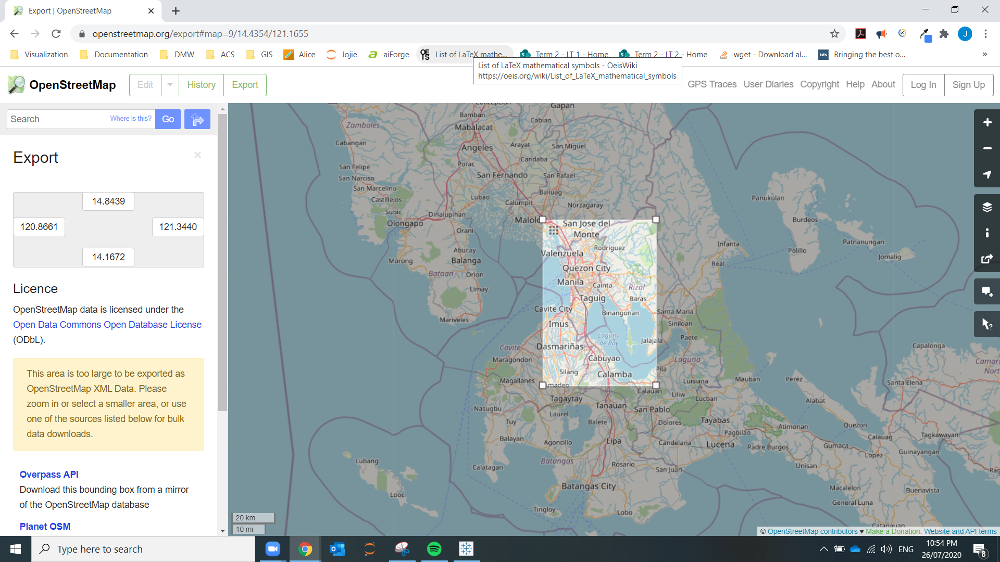



#### Figure 2. Scope of the study in terms of location

### 3. Feature Extraction

To be able to boost the performance of the machine learning algorithm, features were extracted from the raw data. The following process and features are described below:

- __`drop_off_city` and `pick_up_city`__ via reverse geocode
- __`drop_off_geohash` and `pick_up_geohash`__ via geohashing with precision set to 5 (4.89km x 4.89km)
- __`trip_distance`__ using Manhattan distance

In [5]:
def geocode_reverse(df, *args):
    import reverse_geocode
    cities = []
    for lat, lon in tqdm(zip(df[args[0]],df[args[1]])):
        query= (lat,lon),
        res = reverse_geocode.search(query)
        cities.append(res[0]['city'])
    return cities

In [6]:
df['drop_off_city'] = geocode_reverse(
    df, 'drop_off_latitude', 'drop_off_longitude')
df['pick_up_city'] = geocode_reverse(
    df, 'pick_up_latitude', 'pick_up_longitude')

194978it [00:06, 30652.48it/s]
194978it [00:06, 31017.88it/s]


In [7]:
# Correct cities based on city for Metro Manila, province otherwise
mapping = {'Calumpang':'Marikina',
           'Bagong Pagasa':'Quezon City',
           'Taytay':'Rizal',
           'Cainta':'Rizal',
           'Del Monte':'Quezon City',
           'Port Area':'Manila',
           "Sambayanihan People's Village":'Las Piñas',
           'Quiapo':'Manila',
           'Antipolo':'Rizal',
           'San Mateo':'Rizal',
           'Niugan':'Laguna',
           'Teresa':'Rizal',
           'Imus':'Cavite',
           'Tanza':'Cavite',
           'Meycauayan':'Bulacan',
           'Malanday':'Valenzuela',
           'Obando':'Bulacan',
           'Loma de Gato':'Bulacan',
           'Carmona':'Cavite',
           'San Jose del Monte':'Bulacan',
           'Angono':'Rizal',
           'Plaridel':'Rizal',
           'Bacoor':'Cavite',
           'Cavite City':'Cavite',
           'Rodriguez':'Rizal',
           'Pinugay':'Rizal',
           'Cardona':'Rizal',
           'Marilao':'Bulacan',
           'Balagtas':'Bulacan',
           'General Trias':'Cavite',
           'Bocaue':'Bulacan',
           'Binangonan':'Rizal',
           'Kawit':'Cavite',
           'Biñan':'Laguna',
           'Santa Rosa':'Laguna',
           'San Pedro':'Laguna',
           'Cabuyao':'Cavite',
           'Dasmariñas':'Cavite',
           'Aplaya':'Laguna',
           'Guiguinto':'Bulacan',
           'Guyong':'Bulacan',
           'Kanluran':'Cavite',
           'Magsaysay':'Laguna',
           'Noveleta':'Cavite',
           'Pulong Santa Cruz':'Laguna',
           'Sampaloc':'Laguna',
           'Sulucan':'Cavite'
          }
df['drop_off_city'] = df['drop_off_city'].replace(mapping)
df['pick_up_city'] = df['pick_up_city'].replace(mapping)

In [8]:
# Create tags for drop off and pick up if within metro manila
mm_cities = (['Pateros', 'San Juan', 'Pasay', 'Marikina',
              'Makati City', 'Pasig City', 'Quezon City',
              'Mandaluyong City', 'Manila', 'Las Piñas',
              'Caloocan City', 'Taguig', 'Valenzuela',
              'Muntinlupa', 'Malabon', 'Navotas'])

df['drop_off_within_mm'] = df['drop_off_city'].apply(lambda x: 1
                                                     if x in mm_cities else 0)
df['pick_up_within_mm'] = df['pick_up_city'].apply(lambda x: 1
                                                   if x in mm_cities else 0)


In [9]:
def geohash(df, *args):
    geohash=[]
    for lat, lon in tqdm(zip(df[args[0]],df[args[1]])):
        geohash.append(pgh.encode(lat, lon, precision=5))
    return geohash


In [10]:
df['drop_off_geohash'] = geohash(df,'drop_off_latitude','drop_off_longitude')
df['pick_up_geohash'] = geohash(df,'pick_up_latitude','pick_up_longitude')

194978it [00:01, 108042.16it/s]
194978it [00:01, 108110.18it/s]


In [11]:
df = df[df['drop_off_geohash']!='wdw1t']

In [12]:
def cityblock_distance():
    dist = []
    for i, j in zip(df[['pick_up_latitude', 'pick_up_longitude']].to_numpy(),
                df[['drop_off_latitude', 'drop_off_longitude']].to_numpy()):
        dist.append(cityblock(i,j))
    return dist

In [13]:
df['trip_distance'] = cityblock_distance()

### 4. Data Storage

The processed data was saved as `csv` file: `df_premodel.csv`.


#### Data Description

In [14]:
df_eda = df.copy()
df_eda.to_csv('df_premodel.csv', index=False)




| Column | Description |
|--------|-------------|
| `date` | timestamp of booking |
| `day_of_week` | day of week of booking |
| `hour` | hour of booking |
| `weekend` | tag if booking is on weekend |
| `drop_off_latitude` | drop off latitude |
| `drop_off_longitude` | drop off longitude |
| `pick_up_latitude` | pick up latitude |
| `pick_up_longitude` | pick up longitude |
| `pick_up_city` | pick up city|
| `drop_off_city` | drop off city |
| `pick_up_geohash` | pick up based on precision = 5|
| `drop_off_geohash` | drop off geohash based on precision = 5 |
| `fare` | estimated fare amoount |
| `pick_up_distance` | estimated distance of driver to passenger |
| `trip_distance` | estimated trip distance using Manhattan distance |
| `status` | status of booking |



### 5. Exploratory Data Analysis

To understand the features of the dataset, exploratory data analysis was performed before classifying. Throughout this EDA, you will be required to use API keys from MapBox. You may get them from [here](https://www.mapbox.com/) for free. 

In [15]:
df_viz = pd.read_csv('df_premodel.csv')

[Figure 3](#fig3) shows that the dataset is somewhat balanced with about $57\%$ of data with `status` equal to **Allocated** and $43\%$ of data with status equal to **Unallocated**. Hence, it is important to consider other metrics aside from accuracy when evaluating the machine learning model.

<a id='fig3'></a>

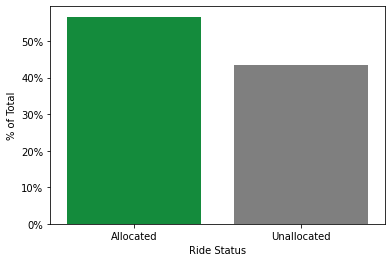

In [16]:
viz = df_viz.groupby('status')[['status']].agg('count').rename(columns={'status':'count'}).reset_index()
viz['total'] = df_viz.shape[0]
viz['percent'] = viz['count']/viz['total'] * 100


fig, ax = plt.subplots()
g = sns.barplot(x='status', y='percent', data=viz,
            order = ['Allocated', 'Unallocated'],
            hue= viz.index, dodge=False, 
            palette = ['#009F35', '#7F7F7F']);

# ax.set_xlabel('Number of Bookings')
ax.set_ylabel('% of Total')
ax.set_xlabel('Ride Status')
ax.yaxis.set_major_formatter(mtick.PercentFormatter())
g.legend_.remove()
plt.show();


#### Figure 3. Distribution of data per `status`

As shown in [Figure 4](#fig4), on a daily-basis, the percentage of bookings that were unallocated tend to be during weekdays, specifically during Fridays.
<a id='fig4'></a>

<ipython-input-17-c40de7bece8e>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_xticklabels(['10%','20%','30%','40%','50%','60%','70%' ]);


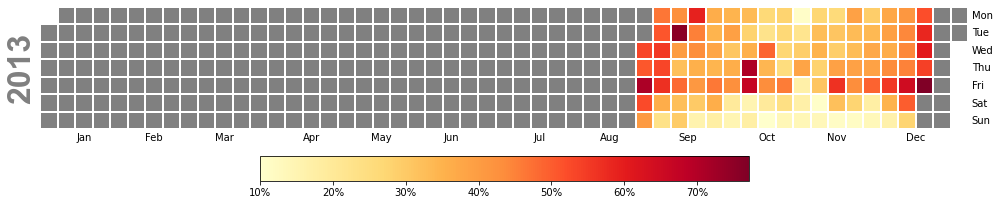

In [17]:
def plot_calmap(df):
    series = df['status'].replace({'Unallocated':1, 'Allocated':0})
    series.index = pd.to_datetime(df['date'], format='%Y-%m-%d')
    df_plot = series.resample('D').mean()*100
    
    fig,ax = calmap.calendarplot(df_plot, fillcolor='grey', cmap='YlOrRd',
                             linewidth=0.25, fig_kws=dict(figsize=(14,8)))
    cbar = fig.colorbar(ax[0].get_children()[1], ax=ax.ravel().tolist(), fraction=0.045, pad=0.05, orientation='horizontal');
    
    cbar.ax.set_xticklabels(['10%','20%','30%','40%','50%','60%','70%' ]);
    
plot_calmap(df_viz)

#### Figure 4. Calendar heatmap of unallocated bookings

In [Figure 5](#fig5), it can be observed that during morning (7-9 AM) the unallocated start to peak especially in business districts of Makati, Ortigas, and BGC. During 3 PM. 

In [18]:
# Functions
def plot_heatmaptime(df, latitude, longitude):
    with open('mapbox_key.txt') as f:
        mapbox = f.read().strip()
        
    a = []
        
    for group, data in df.groupby('hour'):
        a.append([[lat,lon] for lat, lon in zip(data[latitude],
                                                data[longitude])])

    
    date = df['hour'].drop_duplicates().sort_values()
    date = 'Time : ' + date.astype(str) + ':00'
    
    main = folium.Map([14.5547, 121.0244], zoom_start=13)
    hm = HeatMapWithTime(a, index= date.to_list()).add_to(main)
    folium.TileLayer(tiles=mapbox, attr='Mapbox attribution').add_to(main)
    return main


In [19]:
plot_heatmaptime(df_viz[df_viz['status']=='Unallocated'], 'pick_up_latitude', 'pick_up_longitude')

#### Figure 5. Heatmap over time of unallocated rides.

[Figure 6](#fig6) shows pick-up geohash and [Figure 7](#fig7) shows drop off geohash. In both figures, location outside Metro Manila are unallocated.

<a id='fig6'></a>

In [20]:
df_temp = df_viz.copy()
df_temp['status'] = df_temp['status'].replace({'Unallocated':1, 'Allocated':0})
viz = df_temp.groupby('pick_up_geohash')['status'].agg(['sum', 'count']).reset_index()
viz['percent_cancelled'] = viz['sum'] / viz['count']
viz['polygon'] = viz['pick_up_geohash'].apply(lambda x: geohashes_to_polygon(x))
geohash = json.loads(geohash_to_geojson.geohash_to_geojson((viz['pick_up_geohash'].unique())))

token = open("mapbox_token.txt").read() # you need your own token


fig = px.choropleth_mapbox(viz,
                           geojson=geohash,
                           locations = 'pick_up_geohash',
                           featureidkey='properties.id',
                           color='percent_cancelled',
                           color_continuous_scale="YlOrRd",
                           center = {"lat": 14.5547, "lon": 121.02},
                           opacity = 0.75
                          )
fig.update_layout(
    coloraxis_colorbar={"yanchor":"top", "y":1,
                        "title": '% of Unallocated Bookings',
                        "tickvals":[0, 0.25, 0.5, 0.75, 1],
                        "ticktext":['0%', '25%', '50%', '75%', '100%']},
    mapbox = {
        'accesstoken': token,
        'style': "streets", 'zoom':8},
    showlegend = False)

fig.show(renderer = 'notebook')


#### Figure 6. Heatmap of pick-up geohash of unallocated rides

<a id='fig7'></a>

In [21]:
df_temp = df_viz.copy()
df_temp['status'] = df_temp['status'].replace({'Unallocated':1, 'Allocated':0})
viz = df_temp.groupby('drop_off_geohash')['status'].agg(['sum', 'count']).reset_index()
viz['percent_cancelled'] = viz['sum'] / viz['count']
viz['polygon'] = viz['drop_off_geohash'].apply(lambda x: geohashes_to_polygon(x))
geohash = json.loads(geohash_to_geojson.geohash_to_geojson((viz['drop_off_geohash'].unique())))

token = open("mapbox_token.txt").read() # you need your own token


fig = px.choropleth_mapbox(viz,
                           geojson=geohash,
                           locations = 'drop_off_geohash',
                           featureidkey='properties.id',
                           color='percent_cancelled',
                           color_continuous_scale="YlOrRd",
                           center = {"lat": 14.5547, "lon": 121.02},
                           opacity = 0.75
                          )
fig.update_layout(
    coloraxis_colorbar={"yanchor":"top", "y":1,
                        "title": '% of Unallocated Bookings',
                        "tickvals":[0, 0.25, 0.5, 0.75, 1],
                        "ticktext":['0%', '25%', '50%', '75%', '100%']},
    mapbox = {
        'accesstoken': token,
        'style': "streets", 'zoom':8},
    showlegend = False)


fig.show(renderer = 'notebook')


#### Figure 7. Heatmap of drop-off geohash of unallocated rides

### 6. Supervised Learning

To prepare the data for machine learning, the categorical variables were vectorized via one-hot encoding using `pd.get_dummies()`. Additionally, the target variable was encoded via `LabelEncoder()`. The dataset was split (stratified) into 2: train and test data with `test_size = 0.20`.

In [22]:
df_viz = pd.read_csv('df_premodel.csv')

In [23]:
df_model = pd.get_dummies(df_viz,
               columns=[
                        'pick_up_geohash',
                        'drop_off_geohash',
                        'month',
                        'hour',
                        'day_of_week'],
               prefix=[
                       'pick_up_geohash',
                       'drop_off_geohash',
                       'month',
                       'hour',
                       'day_of_week']).drop(columns=['date',
                                                     'fare',
                                                     'weekend',
                                                     'pick_up_distance',
                                                     'drop_off_city',
                                                     'pick_up_city',
                                                     'drop_off_latitude',
                                                     'pick_up_latitude',
                                                     'pick_up_longitude',
                                                     'drop_off_longitude',
                                                     'day',
                                                     'week'])


In [24]:
le = LabelEncoder()
  
y = le.fit_transform(df_model['status'])

In [25]:
feature_names = df_model.drop(columns = 'status').columns

X = df_model.drop(columns = 'status')


X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.20, 
                                                    random_state = 42,
                                                    stratify = y
                                                   )

Prior to hyperparameter tuning, the data was modeled using `LGBMClassifier` with default parameters. Results are shown in [Table 1](#tab1) and [Table2](#tab2). It is worth noting that the training time is less than a minute.

<a id='tab1'></a>

In [26]:
clf = LGBMClassifier(max_depth = 10)

clf.fit(X_train, y_train)
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
print("\nModel Report - Train Data")
print('\n', classification_report(y_train, y_train_pred))




Model Report - Train Data

               precision    recall  f1-score   support

           0       0.70      0.77      0.74     88362
           1       0.66      0.57      0.61     67618

    accuracy                           0.69    155980
   macro avg       0.68      0.67      0.67    155980
weighted avg       0.68      0.69      0.68    155980



#### Table 1. Model results for the train data using LGBMClassifier with default parameters. 

In [27]:
print("\nModel Report - Test Data")
print('\n', classification_report(y_test,  y_test_pred))


Model Report - Test Data

               precision    recall  f1-score   support

           0       0.70      0.77      0.73     22091
           1       0.65      0.56      0.60     16905

    accuracy                           0.68     38996
   macro avg       0.68      0.67      0.67     38996
weighted avg       0.68      0.68      0.68     38996



#### Table 2. Model results for the test  data using LGBMClassifier with default parameters. 

`RandomizedSearchCV` was used to hypertune the parameters. The code was based from this [site](https://www.kaggle.com/mlisovyi/lightgbm-hyperparameter-optimisation-lb-0-761). Results are shown in [Table 3](#tab3) and [Table 4](#tab4). 
<a id='tab3'></a>

In [28]:
fit_params={"early_stopping_rounds":30, 
            "eval_metric" : 'auc', 
            "eval_set" : [(X_test,y_test)],
            'eval_names': ['valid'],
            #'callbacks': [lgb.reset_parameter(learning_rate=learning_rate_010_decay_power_099)],
            'verbose': 100,
            'categorical_feature': 'auto'}

In [29]:
param_test ={'num_leaves': sp_randint(6, 50), 
             'min_child_samples': sp_randint(100, 500), 
             'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
             'subsample': sp_uniform(loc=0.2, scale=0.8), 
             'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
             'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
             'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}

In [30]:
#This parameter defines the number of HP points to be tested
n_HP_points_to_test = 10

clf = LGBMClassifier(max_depth=10,
                     random_state=42,
                     silent=True,
                     metric='None',
                     n_jobs=4,
                     n_estimators=1000)
gs = RandomizedSearchCV(
    estimator=clf, param_distributions=param_test, 
    n_iter=n_HP_points_to_test,
    scoring='accuracy',
    cv=3,
    refit=True,
    random_state=42,
    verbose=False)

#### RandomizedCVSearch

In [31]:
gs.fit(X_train, y_train, **fit_params)

Training until validation scores don't improve for 30 rounds
[100]	valid's auc: 0.705215
[200]	valid's auc: 0.708121
[300]	valid's auc: 0.709308
[400]	valid's auc: 0.710042
[500]	valid's auc: 0.710286
[600]	valid's auc: 0.710465
[700]	valid's auc: 0.710908
Early stopping, best iteration is:
[690]	valid's auc: 0.710936
Training until validation scores don't improve for 30 rounds
[100]	valid's auc: 0.703915
[200]	valid's auc: 0.707393
[300]	valid's auc: 0.708812
[400]	valid's auc: 0.709475
[500]	valid's auc: 0.709747
[600]	valid's auc: 0.709969
[700]	valid's auc: 0.71004
Early stopping, best iteration is:
[672]	valid's auc: 0.710059
Training until validation scores don't improve for 30 rounds
[100]	valid's auc: 0.704494
[200]	valid's auc: 0.707829
[300]	valid's auc: 0.709207
[400]	valid's auc: 0.709621
Early stopping, best iteration is:
[434]	valid's auc: 0.709784
Training until validation scores don't improve for 30 rounds
[100]	valid's auc: 0.724578
[200]	valid's auc: 0.728156
[300]	va

Training until validation scores don't improve for 30 rounds
Early stopping, best iteration is:
[20]	valid's auc: 0.551016
Training until validation scores don't improve for 30 rounds
Early stopping, best iteration is:
[24]	valid's auc: 0.551325
Training until validation scores don't improve for 30 rounds
Early stopping, best iteration is:
[22]	valid's auc: 0.551097
Training until validation scores don't improve for 30 rounds
[100]	valid's auc: 0.74025
[200]	valid's auc: 0.745019
[300]	valid's auc: 0.74747
[400]	valid's auc: 0.748963
[500]	valid's auc: 0.74958
[600]	valid's auc: 0.750302
[700]	valid's auc: 0.750942
[800]	valid's auc: 0.751524
[900]	valid's auc: 0.751998
[1000]	valid's auc: 0.752263
Did not meet early stopping. Best iteration is:
[993]	valid's auc: 0.752287


RandomizedSearchCV(cv=3,
                   estimator=LGBMClassifier(max_depth=10, metric='None',
                                            n_estimators=1000, n_jobs=4,
                                            random_state=42),
                   param_distributions={'colsample_bytree': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000023B5BBBD040>,
                                        'min_child_samples': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000023B57148700>,
                                        'min_child_weight': [1e-05, 0.001, 0.01,
                                                             0.1, 1, 10.0,
                                                             100.0, 1000.0,
                                                             10000.0],
                                        'num_leaves': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000023B5896CF10>,
                                        'reg_alpha': [0, 0.1,

#### Best score and paramaters

In [32]:
print('Best score reached: {} with params: {} '.format(gs.best_score_, gs.best_params_))

Best score reached: 0.6831324498932071 with params: {'colsample_bytree': 0.6640914962437607, 'min_child_samples': 363, 'min_child_weight': 0.01, 'num_leaves': 19, 'reg_alpha': 0, 'reg_lambda': 5, 'subsample': 0.3457888702304499} 


In [33]:
params = {'colsample_bytree': 0.9053708647569991,
          'min_child_samples': 143,
          'min_child_weight': 0.001,
          'num_leaves': 15,
          'reg_alpha': 2,
          'reg_lambda': 20,
          'subsample': 0.7818175966851368} 
clf = LGBMClassifier(max_depth=10,
                     metric='None',
                     n_estimators=1000, n_jobs=4,
                     random_state=42)
 
clf.set_params(**params)

clf.fit(X_train, y_train)
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
print("\nModel Report - Train Data")
print('\n', classification_report(y_train, y_train_pred))




Model Report - Train Data

               precision    recall  f1-score   support

           0       0.72      0.77      0.74     88362
           1       0.67      0.61      0.64     67618

    accuracy                           0.70    155980
   macro avg       0.69      0.69      0.69    155980
weighted avg       0.70      0.70      0.70    155980



#### Table 3. Model results for the train data using LGBMClassifier with parameters found using `RandomizedSearchCV`

In [34]:
print("\Model Report - Test Data")
print('\n', classification_report(y_test,  y_test_pred))

\Model Report - Test Data

               precision    recall  f1-score   support

           0       0.71      0.76      0.73     22091
           1       0.65      0.60      0.62     16905

    accuracy                           0.69     38996
   macro avg       0.68      0.68      0.68     38996
weighted avg       0.69      0.69      0.69     38996



<a id='tab4'></a>

#### Table 4. Model results for the test data using LGBMClassifier with parameters found using `RandomizedSearchCV`

Using `plot_importance`, [Figure 8](#fig8) shows the top 10 features based on gain. **Gain** is as it shows most relevant attribute to interpret the relative importance of each feature [[6]](https://towardsdatascience.com/be-careful-when-interpreting-your-features-importance-in-xgboost-6e16132588e7). From this, we have obtained `hour_18`, `day_of_week_Friday`, and `day_of_week_Sunday` as the top features.

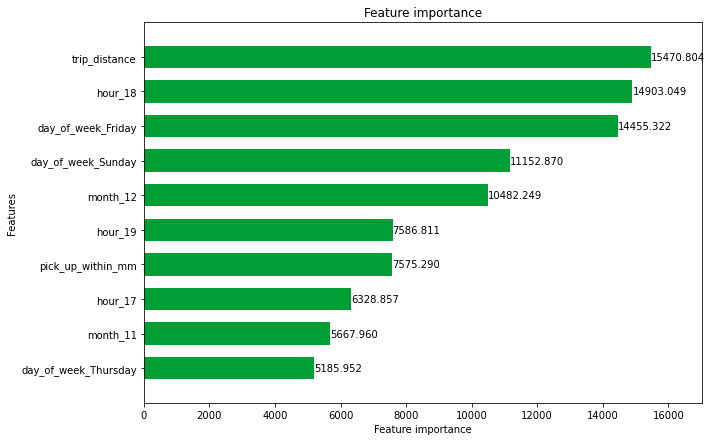

In [35]:
lightgbm.plot_importance(clf, max_num_features = 10, importance_type = 'gain',
                         grid=False, figsize = (10,7),
                         height = 0.65,
                         color = '#009F35');

#### Figure 8. Top features based on gain

In [36]:
# Defining Metric:
pcc = (df_viz['status'].value_counts()[1]/df_viz.shape[0])**2 + (df_viz['status'].value_counts()[0]/df_viz.shape[0])**2
1.25*pcc

0.6360540834281061

### Sensitivity Analysis using CatBoostClassifier

`CatBoostClassifier` was also used for sensitivity analysis. 

See documentation [[here]](https://catboost.ai/docs/concepts/python-reference_catboostclassifier.html)

In [37]:
clf = CatBoostClassifier(iterations=10,
                         eval_metric='AUC',
                         max_depth = 10,
                         learning_rate=0.1)


clf.fit(X_train, y_train)
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
print("\nModel Report - Train Data")
print('\n', classification_report(y_train, y_train_pred))


0:	total: 195ms	remaining: 1.76s
1:	total: 237ms	remaining: 949ms
2:	total: 274ms	remaining: 640ms
3:	total: 310ms	remaining: 464ms
4:	total: 344ms	remaining: 344ms
5:	total: 379ms	remaining: 253ms
6:	total: 413ms	remaining: 177ms
7:	total: 449ms	remaining: 112ms
8:	total: 484ms	remaining: 53.7ms
9:	total: 520ms	remaining: 0us

Model Report - Train Data

               precision    recall  f1-score   support

           0       0.66      0.82      0.73     88362
           1       0.65      0.44      0.53     67618

    accuracy                           0.65    155980
   macro avg       0.65      0.63      0.63    155980
weighted avg       0.65      0.65      0.64    155980



#### Table 5. Model results for the train data using `CatBoostClassifier` 

In [38]:
print("\nModel Report - Test Data")
print('\n', classification_report(y_test,  y_test_pred))



Model Report - Test Data

               precision    recall  f1-score   support

           0       0.66      0.82      0.73     22091
           1       0.65      0.44      0.52     16905

    accuracy                           0.65     38996
   macro avg       0.65      0.63      0.63     38996
weighted avg       0.65      0.65      0.64     38996



#### Table 6. Model results for the test data using `CatBoostClassifier` 

<div><span style="background-color: #009F35; padding-top: 100px; padding-right: 20px; padding-bottom: 50px; padding-left: 20px; color: #ffffff; font-size: 20px; font-weight: bold"> CONCLUSION AND RECOMMENDATION </span></div>

Using the learnings from Machine Learning, I was able to expand the limited features available in the dataset through **feature engineering**. Considering the size of the dataset and the computing power of my laptop, I decided to use **LightGBM** wherein I obtained a $69\%$ accuracy (over the baseline of $63\%$). The top features identified where **6 PM** (`hour_18`), **Friday** (`day_of_week_Friday`), and **Sunday** (`day_of_week_Sunday`). Using the findings from this study, this can help **passengers**, **Grab and its partner drivers**, and **local government units**.


For future studies, the following can be considered:

Data
- use a more recent dataset
- add additional features such as data for weather, holidays, and amenities neary
- use a more precise geohash or use clustering
- use geographically calculated distance for `trip_distance`

Methodology
- use other machine learning models
- use GridSearchCV to hypertune parameters
- try different method to vectorize categorical variables

Study
- expand the study to further classify allocated rides if it is completed or not